# **Audio Deepfake detection 🎧**
---

The project focuses on developing and evaluating models for detecting artificially created or modified audio intended to mimic actual human speech.

---

# **1. Installing Dependencies 📚**


In [ ]:
!pip install librosa numpy pandas matplotlib tensorflow ffmpeg-python

In [ ]:
import os
import shutil
import json
import ffmpeg
import librosa
import librosa.display
import seaborn as sns
import numpy as np
import pandas as pd
import soundfile as sf
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib.cm import get_cmap
from matplotlib.colors import Normalize
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras import layers, models, Sequential, regularizers
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Conv2D, GlobalAveragePooling2D, Dense, BatchNormalization, Dropout, LeakyReLU, MaxPooling2D, Flatten
from tensorflow.keras.regularizers import l2
from sklearn.ensemble import IsolationForest
from sklearn.model_selection import KFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tqdm import tqdm
from IPython.display import Audio
import random
from sklearn.svm import SVC

# **2. Load the Data 📂**

The data is from kaggle, and our own manipulated data for testing.

---

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"shahadadel","key":"2df9bffb703a495078df78ade6084be8"}'}

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c deepfake-detection-challenge

100% 4.12G/4.13G [00:41<00:00, 194MB/s]
100% 4.13G/4.13G [00:41<00:00, 106MB/s]


In [ ]:
!unzip deepfake-detection-challenge.zip

In [ ]:
metadata_path = "/content/train_sample_videos/metadata.json"

In [ ]:
with open(metadata_path, 'r') as file:
  metadata = json.load(file)

In [ ]:
print("Sample Metadata Entry:")
print(list(metadata.items())[:3])

Sample Metadata Entry:
[('aagfhgtpmv.mp4', {'label': 'FAKE', 'split': 'train', 'original': 'vudstovrck.mp4'}), ('aapnvogymq.mp4', {'label': 'FAKE', 'split': 'train', 'original': 'jdubbvfswz.mp4'}), ('abarnvbtwb.mp4', {'label': 'REAL', 'split': 'train', 'original': None})]


In [ ]:
source_dir = "/content/test_videos"
destination_dir = "/content/train_sample_videos"


if not os.path.exists(source_dir):
    print(f"Error: Source directory '{source_dir}' does not exist.")
else:

    for filename in os.listdir(source_dir):
        source_file = os.path.join(source_dir, filename)
        destination_file = os.path.join(destination_dir, filename)


        if os.path.isfile(source_file):
            try:

                shutil.move(source_file, destination_dir)
                print(f"Moved '{filename}' to '{destination_dir}'")
            except Exception as e:
                print(f"Error moving '{filename}': {e}")
        else:
            print(f"Skipping '{filename}' (not a file)")


    if not os.listdir(source_dir):
        os.rmdir(source_dir)
        print(f"Deleted '{source_dir}'")
    else:
        print(f"Source directory '{source_dir}' is not empty.")

# **3. Extract Audio 🎧**
---

In [ ]:
video_dir = "train_sample_videos/"
audio_dir = "extracted_audio/"
os.makedirs(audio_dir, exist_ok = True)

In [ ]:
def extract_audio(video_path, output_path):
  for video in os.listdir(video_path):
    if video.endswith('.mp4'):
      input_file = os.path.join(video_path, video)
      output_file = os.path.join(output_path, os.path.splitext(video)[0]+'.wav')
      if not os.path.exists(output_file):
        ffmpeg.input(input_file).output(output_file).run()

In [ ]:
extract_audio(video_dir, audio_dir)

In [ ]:
def audio_quality(audio_dir):
  filenames =[]
  durations =[]
  sampling_rates =[]

  for filename in os.listdir(audio_dir):
    if filename.endswith('.wav'):
      filepath = os.path.join(audio_dir, filename)
      try:
        y, sr = librosa.load(filepath)
        duration = librosa.get_duration(y=y, sr=sr)
        filenames.append(filename)
        durations.append(duration)
        sampling_rates.append(sr)
      except Exception as e:
        print(f"Error processing {filename}: {e}")

  if filename:
    plt.figure(figsize=(12, 6))
    plt.barh(filenames, durations, color='lightcoral')
    plt.xlabel("Duration (seconds)")
    plt.ylabel("Audio Files")
    plt.title("Durations of Audio Files")
    plt.gca().invert_yaxis()
    plt.tight_layout()


    plt.figure(figsize=(12, 6))
    plt.barh(filenames, sampling_rates, color='indianred')
    plt.xlabel("Sampling Rate (Hz)")
    plt.ylabel("Audio Files")
    plt.title("Sampling Rates of Audio Files")
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

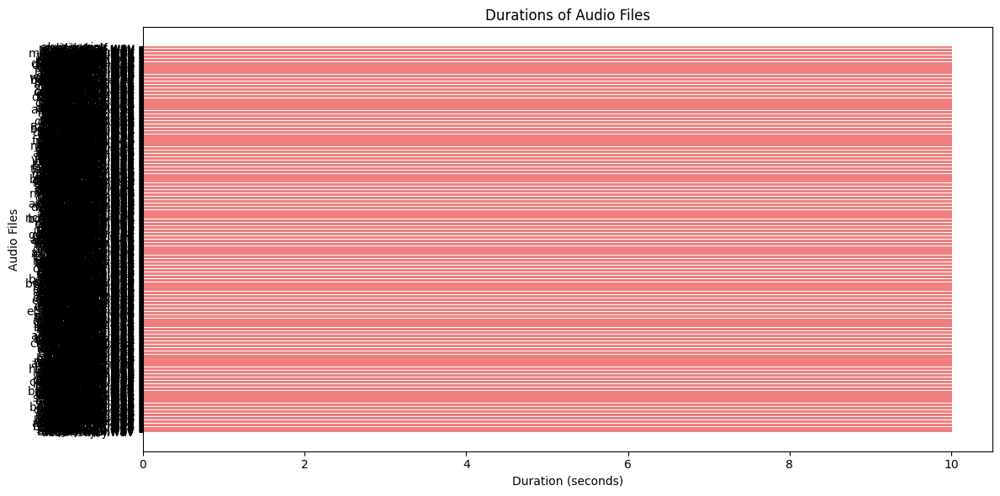

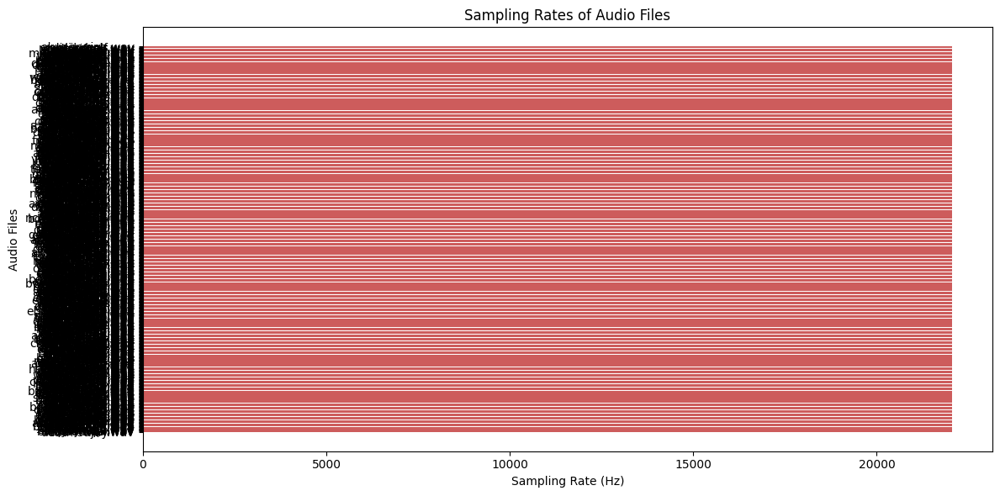

In [ ]:
audio_quality('extracted_audio/')

In [ ]:
mono_count = 0
stereo_count = 0

In [ ]:
for filename in os.listdir('extracted_audio/'):
  if filename.endswith('.wav'):
    filepath = os.path.join('extracted_audio/', filename)
    try:
      y, sr = librosa.load(filepath, mono=False)
      if y.ndim == 1:
        mono_count += 1
      elif y.ndim == 2:
        stereo_count += 1
      else:
        print(f"Unexpected number of channels in {filename}")
    except Exception as e:
      print(f"Error processing {filename}: {e}")

print(f"Number of mono audio files: {mono_count}")
print(f"Number of stereo audio files: {stereo_count}")

Number of mono audio files: 800
Number of stereo audio files: 0


In [ ]:
resampl_sr = 160000

In [ ]:
def resample_audio(audio_dir, sr):
  for filename in os.listdir(audio_dir):
    if filename.endswith('.wav'):
      filepath = os.path.join(audio_dir, filename)
      try:
        y, sr = librosa.load(filepath, sr=None)
        if sr != resampl_sr:
          y_resampled = librosa.resample(y, orig_sr=sr, target_sr=resampl_sr)
          sf.write(filepath, y_resampled, resampl_sr)
          print(f"Resampled {filename} to {resampl_sr} Hz")
      except Exception as e:
        print(f"Error processing {filename}: {e}")


In [ ]:
resample_audio("/content/extracted_audio", resampl_sr)

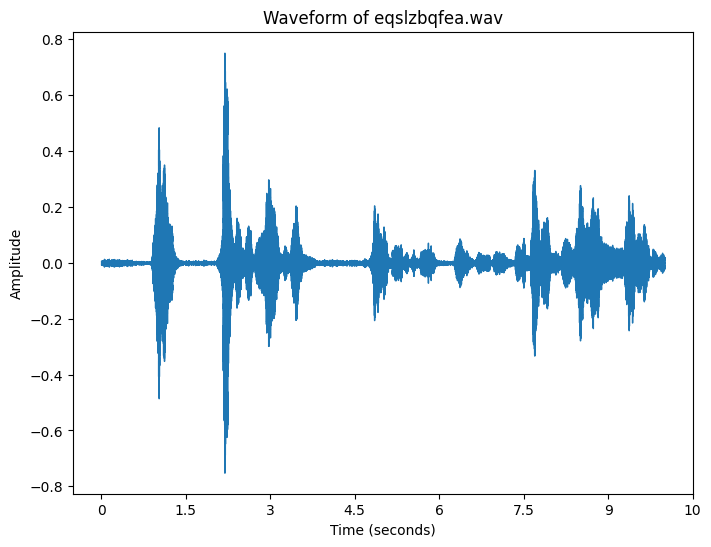

In [ ]:
audio_files = [f for f in os.listdir('/content/extracted_audio/') if f.endswith('.wav')]
random_audio_file = random.choice(audio_files)
audio_path = os.path.join('/content/extracted_audio/', random_audio_file)

try:
  y, sr = librosa.load(audio_path)
  plt.figure(figsize = (8,6))
  librosa.display.waveshow(y, sr=sr)
  plt.title(f'Waveform of {random_audio_file}')
  plt.xlabel('Time (seconds)')
  plt.ylabel('Amplitude')
  plt.show()
except Exception as e:
  print(f"Error processing {random_audio_file}: {e}")

# **4. Prepare Dataset 📐**

This section includes linking audios to the labels to create a dataframe

---

In [ ]:
audio_files = []
labels = []

In [ ]:
for video, details in metadata.items():
  audio_file = os.path.join(audio_dir, video.split('.')[0]+'.wav')
  if os.path.exists(audio_file):
    audio_files.append(audio_file)
    labels.append(1 if details['label'] == "FAKE" else 0)

In [ ]:
df = pd.DataFrame({"audio_file": audio_files, "label": labels})
print(df.head())

                       audio_file  label
0  extracted_audio/aagfhgtpmv.wav      1
1  extracted_audio/aapnvogymq.wav      1
2  extracted_audio/abarnvbtwb.wav      0
3  extracted_audio/abofeumbvv.wav      1
4  extracted_audio/abqwwspghj.wav      1


In [ ]:
csv_file = pd.read_csv("/content/sample_submission.csv")

In [ ]:
csv_file['audio_file'] = "extracted_audio/" + csv_file['filename'].str.replace('.mp4', '.wav')

In [ ]:
csv_file = csv_file.drop(columns=["filename"])

In [ ]:
df = pd.concat([df, csv_file], ignore_index=True)

In [ ]:
df.tail()

,audio_file,label
795,extracted_audio/ztyvglkcsf.wav,0
796,extracted_audio/zuwwbbusgl.wav,0
797,extracted_audio/zxacihctqp.wav,0
798,extracted_audio/zyufpqvpyu.wav,0
799,extracted_audio/zzmgnglanj.wav,0


In [ ]:
df.head()

,audio_file,label
0,extracted_audio/aagfhgtpmv.wav,1
1,extracted_audio/aapnvogymq.wav,1
2,extracted_audio/abarnvbtwb.wav,0
3,extracted_audio/abofeumbvv.wav,1
4,extracted_audio/abqwwspghj.wav,1


# **5. Preprocessing Data 📊**

---

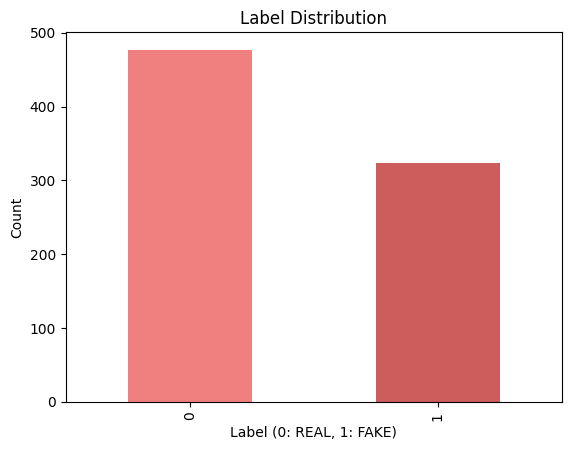

In [ ]:
df['label'].value_counts().plot(kind = 'bar', title = 'Label Distribution', color=['lightcoral', 'indianred'])
plt.xlabel('Label (0: REAL, 1: FAKE)')
plt.ylabel('Count')
plt.show()

In [ ]:
def augment_audio(audio_file, output_dir):
  y , sr = librosa.load(audio_file, sr = None)

  pitch_shift = random.uniform(-5 , 5)
  y = librosa.effects.pitch_shift(y, sr=sr , n_steps=pitch_shift)

  noise_factor = random.uniform(0.005 , 0.05)
  noise = np.random.randn(len(y))
  y = y + noise_factor * noise

  augmented_filename = os.path.join(output_dir, f"aug_{os.path.basename(audio_file)}")
  sf.write(augmented_filename, y, sr)

  return augmented_filename

In [ ]:
label_0 = df[df['label'] == 0]['audio_file'].tolist()
print(len(label_0))
label_1 = df[df['label'] == 1]['audio_file'].tolist()
print(len(label_1))

477
323


In [ ]:
augment_audio_files_real = []

In [ ]:
while len(label_1) + len(augment_audio_files_real) < 500:
  for file in label_1:
    augmented_audio = augment_audio(file, audio_dir)
    augment_audio_files_real.append(augmented_audio)
    if len(label_1) + len(augment_audio_files_real) >= 500:
      break

In [ ]:
augmented_labels_real = [1] * len(augment_audio_files_real)
df_augmented_real = pd.DataFrame({"audio_file": augment_audio_files_real, "label": augmented_labels_real})

In [ ]:
df_label_1 = pd.DataFrame({"audio_file": label_1, "label": [1] * len(label_1)})
df_label_1 = pd.concat([df_label_1, df_augmented_real], ignore_index=True)

In [ ]:
augment_audio_files_fake = []

In [ ]:
while len(label_0) + len(augment_audio_files_fake) < 500:
    for file in label_0:
        augmented_audio = augment_audio(file, audio_dir)
        augment_audio_files_fake.append(augmented_audio)
        if len(label_0) + len(augment_audio_files_fake) >= 500:
            break

In [ ]:
augmented_labels_fake = [0] * len(augment_audio_files_fake)
df_augmented_fake = pd.DataFrame({"audio_file": augment_audio_files_fake, "label": augmented_labels_fake})

In [ ]:
df_label_0 = pd.DataFrame({"audio_file": label_0, "label": [0] * len(label_0)})
df_label_0 = pd.concat([df_label_0, df_augmented_fake], ignore_index=True)


In [ ]:
df_balanced = pd.concat([df_label_0, df_label_1], ignore_index=True)

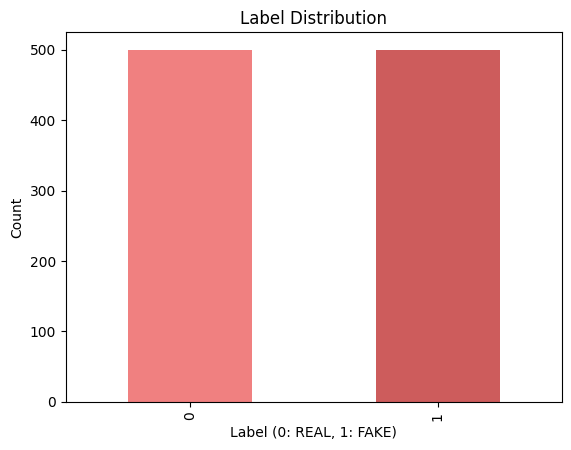

In [ ]:
df_balanced['label'].value_counts().plot(kind = 'bar', title = 'Label Distribution', color=['lightcoral', 'indianred'])
plt.xlabel('Label (0: REAL, 1: FAKE)')
plt.ylabel('Count')
plt.show()

In [ ]:
print(f"Balanced Dataset - label 0 count: {len(df_balanced[df_balanced['label'] == 0])}")
print(f"Balanced Dataset - label 1 count: {len(df_balanced[df_balanced['label'] == 1])}")

Balanced Dataset - label 0 count: 500
Balanced Dataset - label 1 count: 500


In [ ]:
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

In [ ]:
df_balanced.head()

,audio_file,label
0,extracted_audio/ajwpjhrbcv.wav,1
1,extracted_audio/doanjploai.wav,1
2,extracted_audio/dptbnjnkdg.wav,1
3,extracted_audio/cglxirfaey.wav,1
4,extracted_audio/vurjckblge.wav,0


In [ ]:
sample_audio = df_balanced['audio_file'].iloc[200]

In [ ]:
Audio(sample_audio)

In [ ]:
sample_audio2 = df_balanced['audio_file'].iloc[8]
Audio(sample_audio2)

In [ ]:
def normalize_audio(audio_file):
  y, sr = librosa.load(audio_file, sr=None)
  y = librosa.util.normalize(y)
  sf.write(audio_file, y, sr)
  return audio_file

In [ ]:
df_balanced['audio_file'] = df_balanced['audio_file'].apply(normalize_audio)

In [ ]:
sample_audio3 = df_balanced['audio_file'].iloc[0]
Audio(sample_audio3)

**Data Analysis**

In [ ]:
def plot_spectrogram(audio_file, title):
  y , sr = librosa.load(audio_file, sr =None)
  plt.figure(figsize=(12,6))
  spec = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax= 8000)
  spec_db = librosa.power_to_db(spec, ref=np.max)
  librosa.display.specshow(spec_db, sr=sr, x_axis='time', y_axis='mel', fmax=8000)
  plt.colorbar(format='%+2.0f dB')
  plt.title(title)
  plt.show()

In [ ]:
sample_real = df_balanced[df_balanced['label'] == 0].iloc[0]['audio_file']
sample_fake = df_balanced[df_balanced['label'] == 1].iloc[0]['audio_file']

/usr/local/lib/python3.10/dist-packages/librosa/feature/spectral.py:2143: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  mel_basis = filters.mel(sr=sr, n_fft=n_fft, **kwargs)


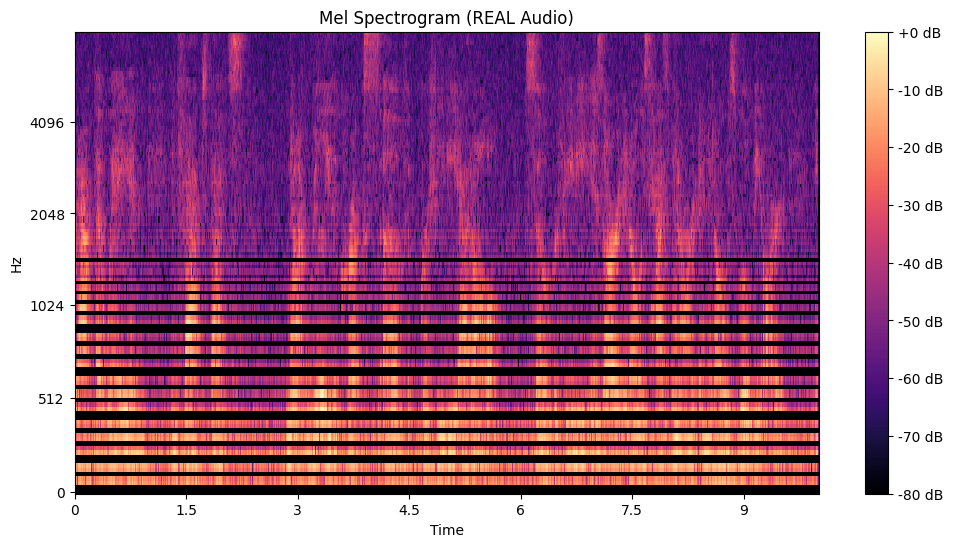

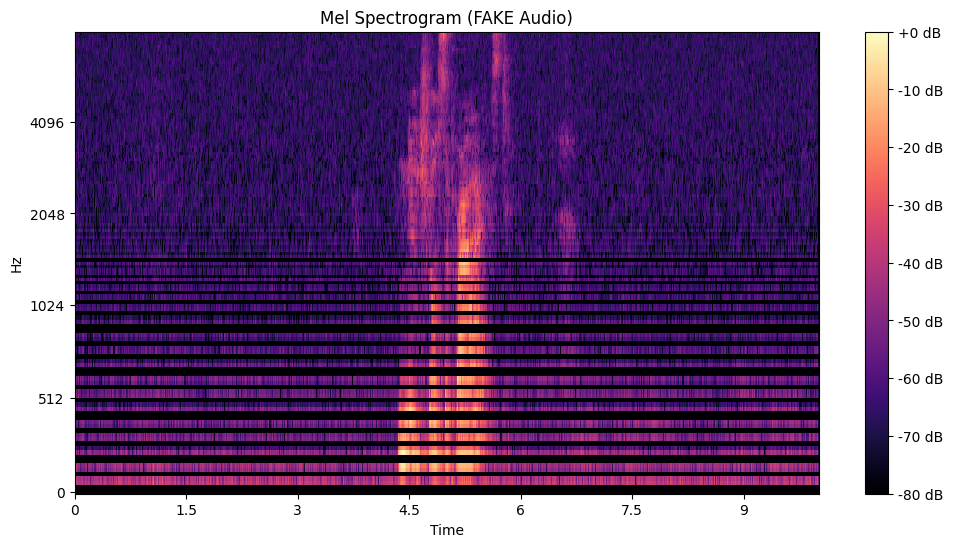

In [ ]:
zgram(sample_real, "Mel Spectrogram (REAL Audio)")
plot_spectrogram(sample_fake, "Mel Spectrogram (FAKE Audio)")

**Static Summary**

In [ ]:
df_balanced.groupby('label')['audio_length'].describe()

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,500.0,10.006384,0.001221,10.005337,10.005337,10.005337,10.007806,10.007806
1,500.0,10.005421,0.000448,10.005337,10.005337,10.005337,10.005337,10.007806


# **6. Extract MFCC 🎛️**

this is used to give our models sound information that a person would perceive
---



In [ ]:
def extract_mfcc(audio_file, sr=16000, n_mfcc= 13):
  y, sr = librosa.load(audio_file, sr=sr)
  mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)
  return np.mean(mfcc.T, axis=0)

In [ ]:
df_balanced['mfcc'] = df_balanced['audio_file'].apply(lambda x: extract_mfcc(x))

In [ ]:
df_balanced.head()

,audio_file,label,audio_length,sample_rate,spectrogram_image,mfcc
0,extracted_audio/ajwpjhrbcv.wav,1,10.005337,160000,/content/spectrograms/ajwpjhrbcv_1.png,"[-273.88763, 52.520416, 23.5314, 22.691467, 7...."
1,extracted_audio/doanjploai.wav,1,10.005337,160000,/content/spectrograms/doanjploai_1.png,"[-109.96418, 89.28353, -3.0178335, 28.639233, ..."
2,extracted_audio/dptbnjnkdg.wav,1,10.005337,160000,/content/spectrograms/dptbnjnkdg_1.png,"[-137.91576, 97.55329, -18.122173, 24.948832, ..."
3,extracted_audio/cglxirfaey.wav,1,10.005337,160000,/content/spectrograms/cglxirfaey_1.png,"[-254.58282, 55.06573, 22.83794, 25.836157, 6...."
4,extracted_audio/vurjckblge.wav,0,10.007806,160000,/content/spectrograms/vurjckblge_0.png,"[-98.2071, 114.515526, 17.888498, 22.73677, -0..."


In [ ]:
X_mfcc = np.array(df_balanced['mfcc'].tolist())
labels_mfcc = df_balanced['label'].tolist()

**Detecting outliers**

In [ ]:
mfcc_features = np.array(df_balanced['mfcc'].tolist())

In [ ]:
mfcc_features.shape

(1000, 13)

In [ ]:
def detect_outliers(data):
  model = IsolationForest(contamination=0.05, random_state=42)
  model.fit(data)
  predictions = model.predict(data)
  outlier_indices = np.where(predictions == -1)[0]
  return outlier_indices

In [ ]:
outliers = detect_outliers(mfcc_features)

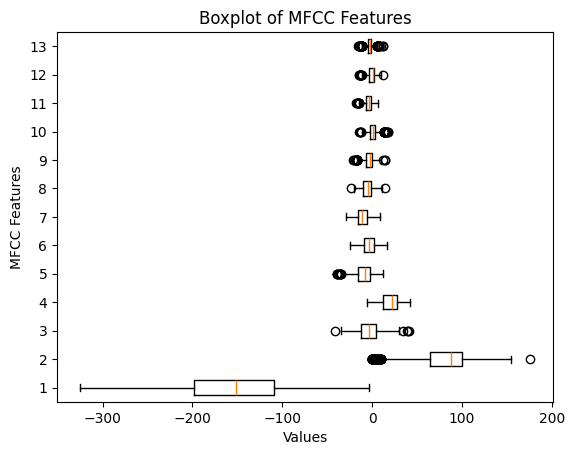

In [ ]:
plt.boxplot(mfcc_features, vert=False)
plt.title("Boxplot of MFCC Features")
plt.xlabel("Values")
plt.ylabel("MFCC Features")
plt.show()

In [ ]:
scaler = StandardScaler()
mfcc_features = scaler.fit_transform(mfcc_features)

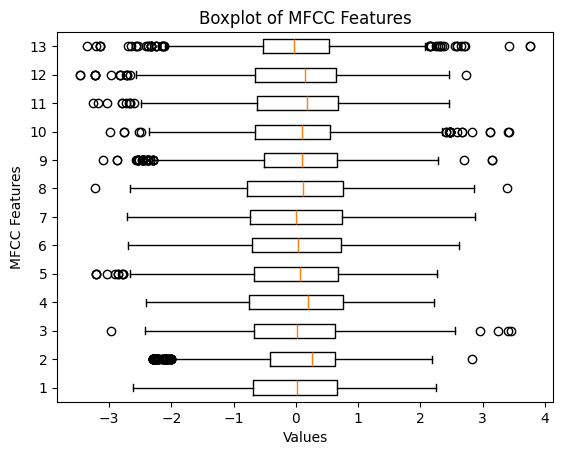

In [ ]:
plt.boxplot(mfcc_features, vert=False)
plt.title("Boxplot of MFCC Features")
plt.xlabel("Values")
plt.ylabel("MFCC Features")
plt.show()

**Encoding**

In [ ]:
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(df_balanced['label'])

# **7. Split data 📊**

---

In [ ]:
train_df, test_df = train_test_split(df_balanced, test_size=0.2, random_state=42)

In [ ]:
train_df, val_df = train_test_split(train_df, test_size = 0.2, random_state=42 )

In [ ]:
print(f"Training samples: {len(train_df)}")
print(f"Validation samples: {len(val_df)}")
print(f"Test samples: {len(test_df)}")

Training samples: 640
Validation samples: 160
Test samples: 200


In [ ]:
train_df['label'] = train_df['label'].astype(str)
val_df['label'] = val_df['label'].astype(str)
test_df['label'] = test_df['label'].astype(str)

In [ ]:
train_df.to_csv('/content/train_data.csv', index=False)
val_df.to_csv('/content/val_data.csv', index=False)
test_df.to_csv('/content/test_data.csv', index=False)

**7.1 MFCC Data Preprocessing**

In [ ]:
def extract_mfcc_features(df):
    mfcc_features = np.array(df['mfcc'].tolist())
    return mfcc_features

In [ ]:
X_train_mfcc = extract_mfcc_features(train_df)
X_val_mfcc = extract_mfcc_features(val_df)
X_test_mfcc = extract_mfcc_features(test_df)

In [ ]:
scaler = StandardScaler()
X_train_mfcc_normalized = scaler.fit_transform(X_train_mfcc)
X_val_mfcc_normalized = scaler.transform(X_val_mfcc)
X_test_mfcc_normalized = scaler.transform(X_test_mfcc)

In [ ]:
y_train_mfcc = tf.keras.utils.to_categorical(train_df['label'].astype(int), num_classes=2)
y_val_mfcc = tf.keras.utils.to_categorical(val_df['label'].astype(int), num_classes=2)
y_test_mfcc = tf.keras.utils.to_categorical(test_df['label'].astype(int), num_classes=2)

# **8. Build a CNN Model 🧠**

---

**Model 1**

In [ ]:
model2 = Sequential()
model2.add(Dense(256, input_dim=X_train_mfcc_normalized.shape[1], activation='relu'))
model2.add(BatchNormalization())
model2.add(Dropout(0.5))
model2.add(Dense(256, activation='relu'))
model2.add(BatchNormalization())
model2.add(Dropout(0.7))
model2.add(Dense(128, activation='relu'))
model2.add(BatchNormalization())
model2.add(Dropout(0.7))
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.9))
model2.add(Dense(64, activation='relu'))
model2.add(Dense(2, activation='sigmoid'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
learning_rate = 0.01
optimizer = Adam(learning_rate=learning_rate)

In [ ]:
model2.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
history22 = model2.fit(X_train_mfcc_normalized, y_train_mfcc, epochs=50, batch_size=32, validation_data=(X_val_mfcc_normalized, y_val_mfcc))

Epoch 1/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 7s 40ms/step - accuracy: 0.5444 - loss: 1.9844 - val_accuracy: 0.6750 - val_loss: 0.6059
Epoch 2/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.5587 - loss: 1.1802 - val_accuracy: 0.6500 - val_loss: 0.6280
Epoch 3/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5975 - loss: 0.7475 - val_accuracy: 0.6187 - val_loss: 0.6421
Epoch 4/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6363 - loss: 0.6809 - val_accuracy: 0.6000 - val_loss: 0.6339
Epoch 5/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6638 - loss: 0.6341 - val_accuracy: 0.5750 - val_loss: 0.6075
Epoch 6/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6554 - loss: 0.6582 - val_accuracy: 0.6500 - val_loss: 0.5337
Epoch 7/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.7347 - loss: 0.5674 - val_accuracy: 0.7063 - val_loss: 0.5091
Epoch 8/50
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7806 - loss: 0.5488 - val_accuracy: 0.6500 - val_loss

# **9. Evaluation 📈**

---

In [ ]:
loss2, accuracy2 = model2.evaluate(X_test_mfcc_normalized, y_test_mfcc)
print(f"Test Loss: {loss2}")
print(f"Test Accuracy: {accuracy2}")

7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 97ms/step - accuracy: 0.8158 - loss: 0.4004
Test Loss: 0.3913455903530121
Test Accuracy: 0.824999988079071


In [ ]:
print(f"Training Accuracy: {max(history22.history['accuracy'])}")
print(f"Validation Accuracy: {max(history22.history['val_accuracy'])}")
print(f"Test Accuracy: {accuracy2}")

Training Accuracy: 0.875
Validation Accuracy: 0.887499988079071
Test Accuracy: 0.824999988079071


In [ ]:
y2_pred = model2.predict(X_test_mfcc_normalized)
y2_pred_classes = np.argmax(y2_pred, axis=1)

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


In [ ]:
cm22 = confusion_matrix(np.argmax(y_test_mfcc, axis=1), y2_pred_classes)

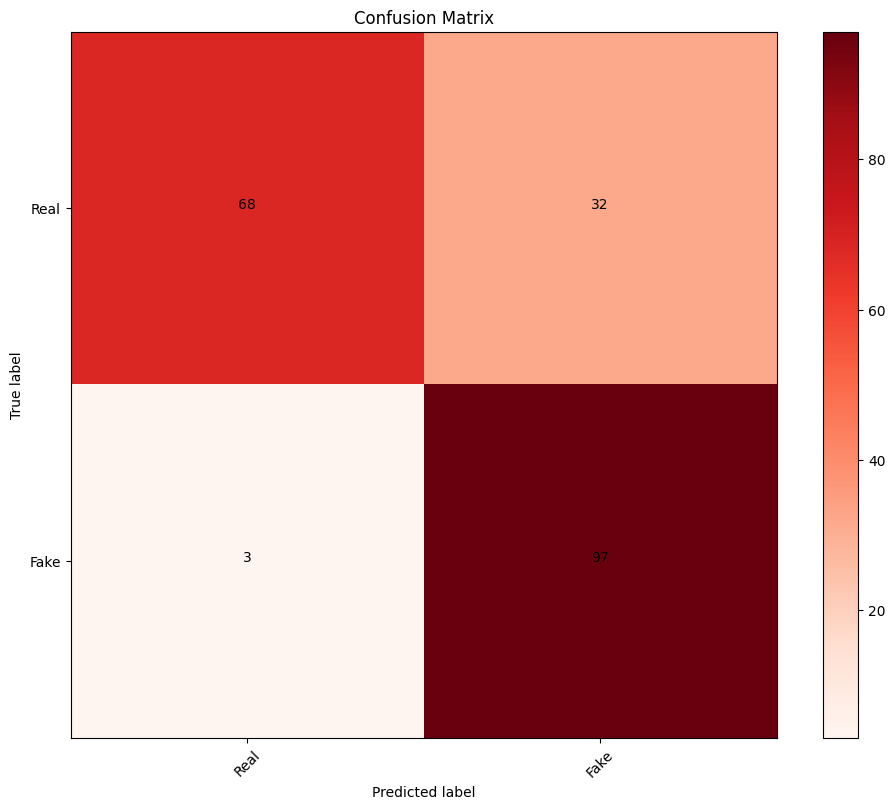

In [ ]:
plt.figure(figsize=(10,8))
plt.imshow(cm22 , interpolation='nearest', cmap='Reds')
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(2)
plt.xticks(tick_marks, ['Real', 'Fake'], rotation=45)
plt.yticks(tick_marks, ['Real', 'Fake'])

thresh = cm22.max() / 2.
for i in range(cm22.shape[0]):
  for j in range(cm22.shape[1]):
    plt.text(j, i, cm22[i, j],
             horizontalalignment="center",
             color="black" if cm22[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

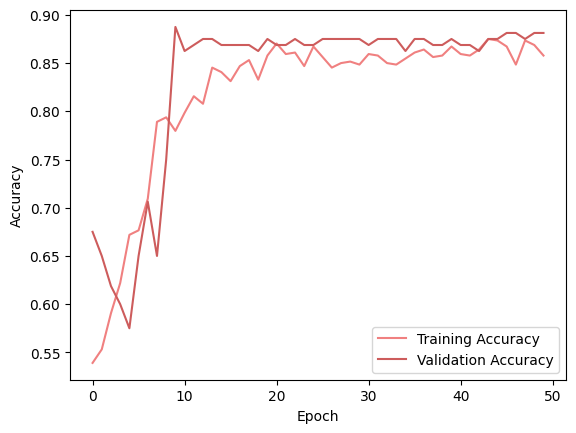

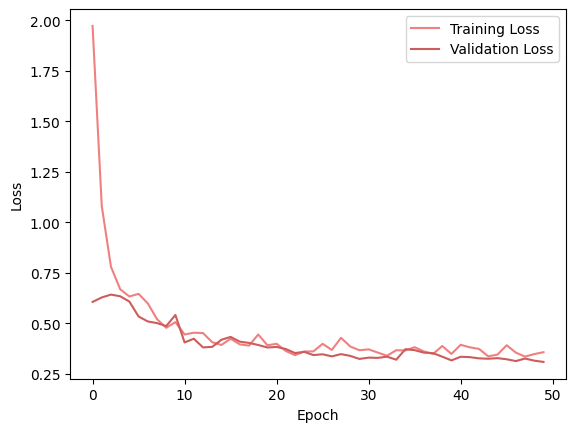

In [ ]:
plt.plot(history22.history['accuracy'], label='Training Accuracy',color='lightcoral')
plt.plot(history22.history['val_accuracy'], label='Validation Accuracy', color='indianred')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history22.history['loss'], label='Training Loss', color='lightcoral')
plt.plot(history22.history['val_loss'], label='Validation Loss', color='indianred')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# **10. SVM**

In [ ]:
svm_model = SVC(kernel='linear', C=1)
svm_model.fit(X_train_mfcc_normalized, np.argmax(y_train_mfcc, axis=1))

SVC(C=1, kernel='linear')

# **11. Evaluation**

---

In [ ]:
y_pred_svm = svm_model.predict(X_test_mfcc_normalized)

In [ ]:
accuracy_svm = accuracy_score(np.argmax(y_test_mfcc, axis=1), y_pred_svm)
print(f"SVM Test Accuracy: {accuracy_svm}")

SVM Test Accuracy: 0.79


In [ ]:
print(classification_report(np.argmax(y_test_mfcc, axis=1), y_pred_svm))

              precision    recall  f1-score   support

           0       0.81      0.76      0.78       100
           1       0.77      0.82      0.80       100

    accuracy                           0.79       200
   macro avg       0.79      0.79      0.79       200
weighted avg       0.79      0.79      0.79       200



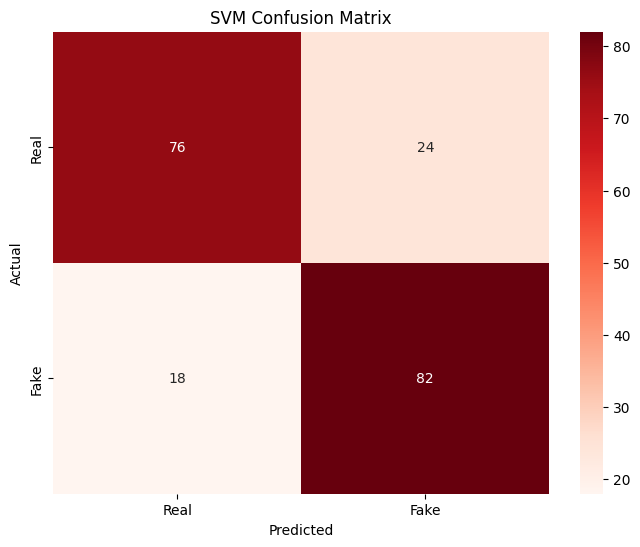

In [ ]:
cm_svm = confusion_matrix(np.argmax(y_test_mfcc, axis=1), y_pred_svm)
plt.figure(figsize=(8, 6))
sns.heatmap(cm_svm, annot=True, fmt="d", cmap="Reds",
            xticklabels=['Real', 'Fake'], yticklabels=['Real', 'Fake'])
plt.title('SVM Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()